<a href="https://colab.research.google.com/github/MariiaKalinina/BM/blob/main/Lithology/lithology_codes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PNG

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [ ]:
!pip install GitPython
from git import Repo

In [ ]:
!git clone https://github.com/MariiaKalinina/BM.git

Cloning into 'BM'...
remote: Enumerating objects: 915, done.
remote: Counting objects: 100% (284/284), done.
remote: Compressing objects: 100% (58/58), done.
remote: Total 915 (delta 257), reused 226 (delta 226), pack-reused 631 (from 1)
Receiving objects: 100% (915/915), 95.59 MiB | 10.61 MiB/s, done.
Resolving deltas: 100% (518/518), done.
Updating files: 100% (63/63), done.


In [ ]:
lithology_patterns_presentation = pd.read_excel("/content/BM/Lithology/Lithology_Patterns_Presentation.xlsx")

In [ ]:
lithology_patterns_presentation.head()

,Lithology name,Code
0,Sandstone (typical),1
1,Sandstone (clay rich),2
2,Sandstone (clay poor),3
3,"Sandstone (quartzite, typical)",4
4,"Sandstone (quartzite, very quartz rich)",5


Lithology: Sandstone (typical) (Code: 1)


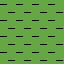

Lithology: Sandstone (clay rich) (Code: 2)


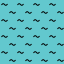

Lithology: Sandstone (clay poor) (Code: 3)


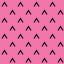

In [ ]:
import os
from IPython.display import Image, display

df = lithology_patterns_presentation[0:3]

# Path to PNGs (adjust if needed)
png_dir = "/content/BM/Lithology/Assets_png/"

# Display lithology name + PNG for each row
for idx, row in df.iterrows():
    lithology_name = row["Lithology name"]
    code = row["Code"]
    png_path = os.path.join(png_dir, f"{code}.png")  # e.g., "/content/.../1.png"

    if os.path.exists(png_path):
        print(f"Lithology: {lithology_name} (Code: {code})")
        display(Image(filename=png_path, width=200))  # Adjust width as needed
    else:
        print(f"⚠️ PNG not found for Code {code}: {png_path}")

## Final plot visualization

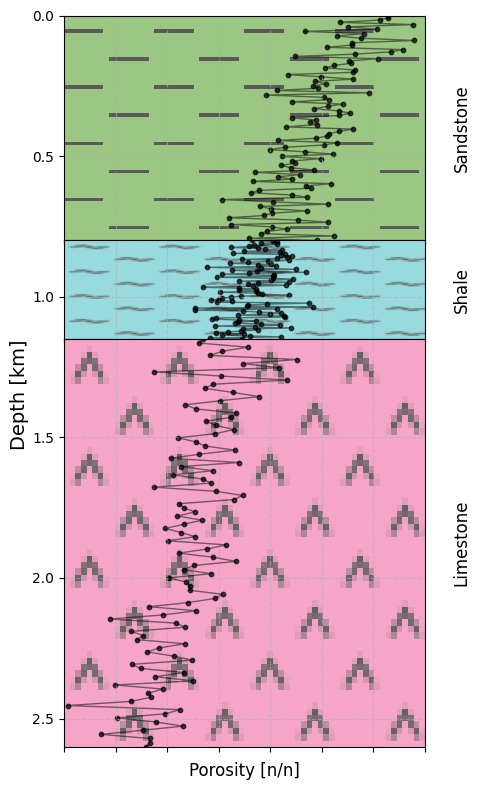

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from matplotlib.gridspec import GridSpec
import os

# Function to generate synthetic porosity-depth data
def generate_porosity_depth_data(top_depth, bottom_depth, resolution=100):
    """
    Generate synthetic porosity-depth data using an exponential decay model.

    Parameters:
        top_depth (float): Top depth of the layer (km).
        bottom_depth (float): Bottom depth of the layer (km).
        resolution (int): Number of points to generate for the depth range.

    Returns:
        depths (np.ndarray): Array of depth values (km).
        porosities (np.ndarray): Array of corresponding porosity values.
    """
    depths = np.linspace(top_depth, bottom_depth, resolution)  # Depth range
    porosities = 0.6 * np.exp(-depths / 2) + 0.05 * np.random.normal(size=resolution)  # Add noise
    return depths, porosities

# Example DataFrame with lithology and PNG file paths
df = [
    {"Code": "A", "Lithology name": "Sandstone", "Top Depth": 0.0, "Bottom Depth": 0.8, "PNG Path": "/content/BM/Lithology/Assets_png/1.png"},
    {"Code": "B", "Lithology name": "Shale", "Top Depth": 0.8, "Bottom Depth": 1.15, "PNG Path": "/content/BM/Lithology/Assets_png/2.png"},
    {"Code": "C", "Lithology name": "Limestone", "Top Depth": 1.15, "Bottom Depth": 2.6, "PNG Path": "/content/BM/Lithology/Assets_png/3.png"},
]

# Configuration parameters
PLOT_COL_RATIO = 4     # Width ratio for porosity-depth plot column
SPACER_COL_RATIO = 0.5 # Width ratio for spacer column
TEXT_COL_RATIO = 1     # Width ratio for lithology name column
ROW_HEIGHT_PER_KM = 1.5  # Height per km of depth (inches)
ROW_SPACING = 0.0      # Additional spacing between rows (inches)
FONT_SIZE = 12
DEPTH_TICK_STEP = 0.5  # Step for depth ticks (in km)

# Calculate row heights proportional to layer thickness
layer_thicknesses = [row["Bottom Depth"] - row["Top Depth"] for row in df]
total_thickness = sum(layer_thicknesses)
row_heights = [thickness / total_thickness for thickness in layer_thicknesses]  # Normalize to sum to 1

# Create the figure and GridSpec layout
fig = plt.figure(figsize=(6, 8))  # Fixed width, height will be adjusted by row_heights
gs = GridSpec(len(df), 3, width_ratios=[PLOT_COL_RATIO, SPACER_COL_RATIO, TEXT_COL_RATIO],
              height_ratios=row_heights, hspace=ROW_SPACING)  # Vertical spacing between rows

# Shared y-axis label
fig.text(0.01, 0.5, 'Depth [km]', va='center', rotation='vertical', fontsize=14)

# Determine global depth range for consistent y-ticks
min_depth = min(row["Top Depth"] for row in df)
max_depth = max(row["Bottom Depth"] for row in df)
depth_ticks = np.arange(np.floor(min_depth), np.ceil(max_depth) + DEPTH_TICK_STEP, DEPTH_TICK_STEP)

for i, row in enumerate(df):
    code = row["Code"]
    png_path = row["PNG Path"]

    # Left panel - Porosity-Depth Plot with PNG Background
    ax_plot = fig.add_subplot(gs[i, 0])

    # Display the PNG image as the background
    if os.path.exists(png_path):
        img = mpimg.imread(png_path)
        ax_plot.imshow(img,
                       aspect='auto',
                       extent=[0, 0.7, row["Bottom Depth"], row["Top Depth"]],
                       alpha=0.65)  # Match plot limits
        ax_plot.set_xticklabels([])
    else:
        ax_plot.text(0.1, 0.5, f"No Pattern\n{code}",
                     ha='center', va='center', fontsize=FONT_SIZE)

    # Generate synthetic porosity-depth data for the current layer
    depths, porosities = generate_porosity_depth_data(row["Top Depth"], row["Bottom Depth"])

    # Scatter plot of porosity vs depth
    ax_plot.scatter(porosities, depths, color='black', s=10, alpha=0.7, label='Porosity')

    # Optionally, add a line plot for smoothing
    ax_plot.plot(porosities, depths, color='black', linewidth=1, alpha=0.5)

    # Add labels and formatting
    ax_plot.set_xlabel('Porosity [n/n]', fontsize=12)
    ax_plot.invert_yaxis()  # Invert y-axis so depth increases downward
    ax_plot.grid(True, linestyle='--', alpha=0.6)  # Add grid lines for better readability
    ax_plot.set_xlim(0, 0.7)  # Set x-axis limits for porosity
    ax_plot.set_ylim(row["Bottom Depth"], row["Top Depth"])  # Set y-axis limits for depth

    # Filter depth ticks and labels for the current layer
    filtered_ticks = [tick for tick in depth_ticks if row["Top Depth"] <= tick <= row["Bottom Depth"]]
    ax_plot.set_yticks(filtered_ticks)
    ax_plot.set_yticklabels([f"{tick:.1f}" for tick in filtered_ticks])

    # Remove individual y-axis labels
    ax_plot.set_ylabel('')

    # Right panel - Lithology Name
    ax_text = fig.add_subplot(gs[i, 1])
    ax_text.text(0.5, 0.5,
                f"{row['Lithology name']}",
                ha='center', va='center', fontsize=FONT_SIZE, rotation=90)
    ax_text.axis('off')

plt.tight_layout()
plt.subplots_adjust(left=0.1, hspace=ROW_SPACING * 2)  # Extra spacing control
plt.show()

# With Hatch (from scratch)

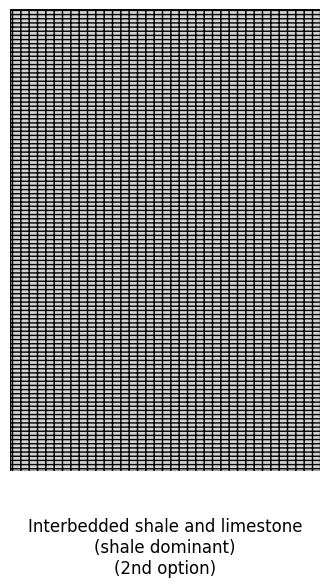

In [ ]:
import matplotlib.pyplot as plt

# Define the custom hatch pattern
custom_hatch = '----||'  # Four dashes to create horizontal lines with gaps

# Create a figure and axes
fig, ax = plt.subplots(figsize=(4, 6))

# Add a rectangle with the custom hatch pattern
ax.add_patch(plt.Rectangle((0, 0), 1, 1, hatch=custom_hatch, edgecolor='black', facecolor='lightgray'))

# Remove axis ticks and labels
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

# Set title
ax.text(0.5, -0.1, "Interbedded shale and limestone\n(shale dominant)\n(2nd option)", ha='center', va='top', fontsize=12)

# Save the figure as a PNG file
output_file = "custom_hatch_pattern.png"
plt.savefig(output_file, dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

<ipython-input-105-8d1fab149e0e>:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(2, 2))  # Small square figure


All 1110 hatch patterns have been saved in the 'hatch_patterns' directory.


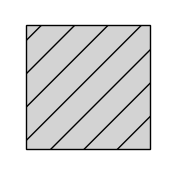

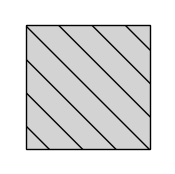

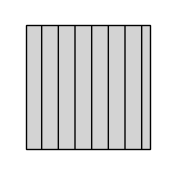

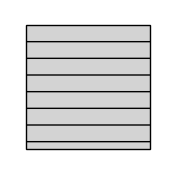

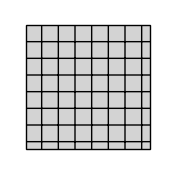

...

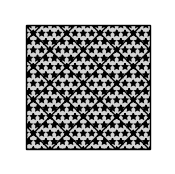

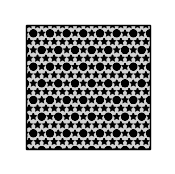

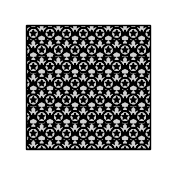

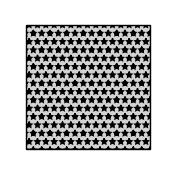

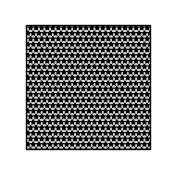

In [ ]:
import matplotlib.pyplot as plt
import os

# Default hatch patterns
default_hatches = ['/', '\\', '|', '-', '+', 'x', 'o', 'O', '.', '*']

# Generate all combinations of hatches (up to 3 characters)
all_hatches = []
for i in range(1, 4):  # Combinations of length 1, 2, and 3
    for hatch in default_hatches:
        if i == 1:
            all_hatches.append(hatch)  # Single hatch
        elif i == 2:
            for second_hatch in default_hatches:
                all_hatches.append(hatch + second_hatch)  # Two-character combinations
        elif i == 3:
            for second_hatch in default_hatches:
                for third_hatch in default_hatches:
                    all_hatches.append(hatch + second_hatch + third_hatch)  # Three-character combinations

# Create a directory to save the hatch images
output_dir = "hatch_patterns"
os.makedirs(output_dir, exist_ok=True)  # Create the directory if it doesn't exist

# Loop through each hatch pattern and save it as a separate PNG file
for idx, hatch in enumerate(all_hatches):
    # Create a new figure for each hatch
    fig, ax = plt.subplots(figsize=(2, 2))  # Small square figure

    # Plot a rectangle with the current hatch pattern
    ax.add_patch(plt.Rectangle((0.1, 0.1), 0.8, 0.8, hatch=hatch, edgecolor='black', facecolor='lightgray'))

    # Remove axes and set limits
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis('off')  # Turn off the axis

    # # Save the figure as a PNG file
    # output_file = os.path.join(output_dir, f"hatch_{idx+1:04d}.png")  # File name with leading zeros
    # plt.savefig(output_file, dpi=300, bbox_inches='tight', pad_inches=0.1)  # High resolution, tight bounding box

    # # Close the figure to free memory
    # plt.close(fig)

print(f"All {len(all_hatches)} hatch patterns have been saved in the '{output_dir}' directory.")

In [ ]:
# Read CSV back into DataFrame
df = pd.read_csv('lithology_codes.csv')
lithology_dict = df.set_index('code').to_dict(orient='index')

print("Data read from CSV:")
df.head()

Data read from CSV:


,code,lith,lith_num,hatch,color
0,30000,Sandstones,1,..,#ffff00
1,65030,Sandstone/Shale,2,-.,#ffe119
2,65000,Shales,3,-..,#bebebe
3,80000,Marl,4,NaN,#7cfc00
4,74000,Dolomite,5,-\,blue


In [ ]:
# Data Example

# lithology_numbers = {
#     30000: {'lith': 'Sandstones', 'lith_num': 1, 'hatch': '..', 'color': '#ffff00'},
#     65030: {'lith': 'Sandstone/Shale', 'lith_num': 2, 'hatch': '-.', 'color': '#ffe119'},
#     65000: {'lith': 'Shales', 'lith_num': 3, 'hatch': '-..', 'color': '#bebebe'},
#     80000: {'lith': 'Marl', 'lith_num': 4, 'hatch': '', 'color': '#7cfc00'},
#     74000: {'lith': 'Dolomite', 'lith_num': 5, 'hatch': '-\\', 'color': 'blue'},
#     70000: {'lith': 'Limestones', 'lith_num': 6, 'hatch': '+', 'color': '#80ffff'},
#     70032: {'lith': 'Chalk', 'lith_num': 7, 'hatch': '..', 'color': '#80ffff'},
#     88000: {'lith': 'Halite', 'lith_num': 8, 'hatch': 'x', 'color': '#7ddfbe'},
#     86000: {'lith': 'Anhydrite', 'lith_num': 9, 'hatch': '-/', 'color': '#ff80ff'},
#     99000: {'lith': 'Tuff', 'lith_num': 10, 'hatch': '||', 'color': '#ff8c00'},
#     90000: {'lith': 'Quartzite', 'lith_num': 11, 'hatch': 'oo', 'color': '#ffe119'},
#     93000: {'lith': 'Basement', 'lith_num': 12, 'hatch': '-|', 'color': '#ef138a'}
# }

In [ ]:
# Create DataFrame from lithology_numbers
df_lith = pd.DataFrame.from_dict(lithology_dict, orient='index')
df_lith.reset_index(inplace=True)
df_lith.rename(columns={'index': 'code'}, inplace=True)

# Clean hatch patterns - replace empty strings and NaN with None
df_lith['hatch'] = df_lith['hatch'].replace('', None)
df_lith['hatch'] = df_lith['hatch'].replace(np.nan, None)

# Example: Prepare data for plotting (e.g., create a lithology legend)
lithology_legend = df_lith[['lith', 'lith_num', 'hatch', 'color']].copy()
lithology_legend = lithology_legend.sort_values('lith_num')

lithology_legend

,lith,lith_num,hatch,color
0,Sandstones,1,..,#ffff00
1,Sandstone/Shale,2,-.,#ffe119
2,Shales,3,-..,#bebebe
3,Marl,4,None,#7cfc00
4,Dolomite,5,-\,blue
5,Limestones,6,+,#80ffff
6,Chalk,7,..,#80ffff
7,Halite,8,x,#7ddfbe
8,Anhydrite,9,-/,#ff80ff
9,Tuff,10,||,#ff8c00


<ipython-input-5-d654fefcca23>:39: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


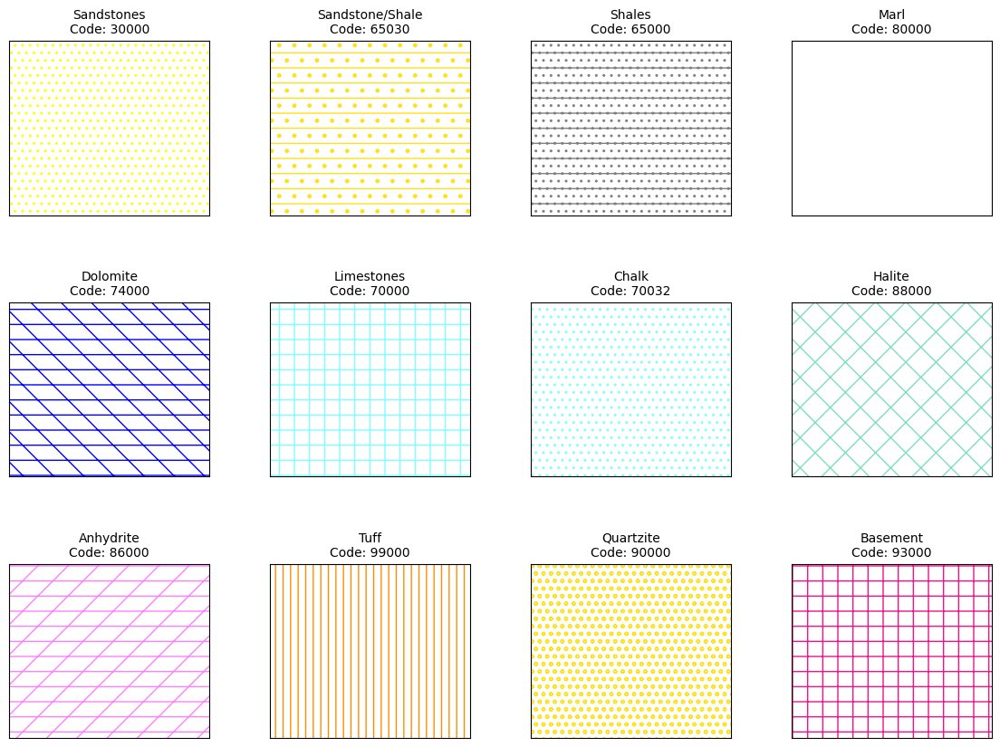

In [ ]:
# Visualization
y = [0, 1]
x = [1, 1]

fig, axes = plt.subplots(ncols=4, nrows=3,
                        figsize=(14, 10),
                        subplot_kw={'xticks': [], 'yticks': []},
                        gridspec_kw={'wspace': 0.3, 'hspace': 0.5})

axes = axes.flat

for i, row in df_lith.iterrows():
    if i >= len(axes):
        break

    ax = axes[i]
    ax.plot(x, y, alpha=0)

    # Get hatch pattern, ensuring it's valid
    hatch_pattern = row['hatch'] if isinstance(row['hatch'], str) else None

    if row['lith'] == 'Shales':
        ax.fill_betweenx(y, 0, 1,
                        facecolor='none',
                        edgecolor='gray',
                        hatch=hatch_pattern,
                        linewidth=0.5)
    else:
        ax.fill_betweenx(y, 0, 1,
                        facecolor='none',
                        edgecolor=row['color'],
                        hatch=hatch_pattern,
                        linewidth=0.5)

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_title(f"{row['lith']}\nCode: {row['code']}", fontsize=10)

plt.tight_layout()
plt.show()

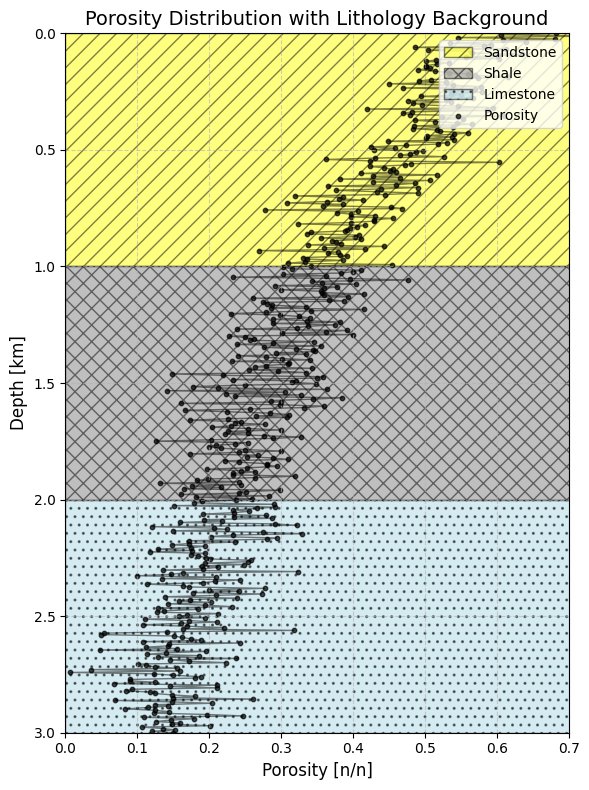

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Function to generate synthetic porosity-depth data
def generate_porosity_depth_data(top_depth, bottom_depth, resolution=100):
    """
    Generate synthetic porosity-depth data using an exponential decay model.

    Parameters:
        top_depth (float): Top depth of the layer (km).
        bottom_depth (float): Bottom depth of the layer (km).
        resolution (int): Number of points to generate for the depth range.

    Returns:
        depths (np.ndarray): Array of depth values (km).
        porosities (np.ndarray): Array of corresponding porosity values.
    """
    depths = np.linspace(top_depth, bottom_depth, resolution)  # Depth range
    porosities = 0.6 * np.exp(-depths / 2) + 0.05 * np.random.normal(size=resolution)  # Add noise
    return depths, porosities

# Example lithology data
lithology_data = [
    {"name": "Sandstone", "top_depth": 0.0, "bottom_depth": 1.0, "color": "yellow", "hatch": "//"},
    {"name": "Shale", "top_depth": 1.0, "bottom_depth": 2.0, "color": "gray", "hatch": "xx"},
    {"name": "Limestone", "top_depth": 2.0, "bottom_depth": 3.0, "color": "lightblue", "hatch": ".."},
]

# Generate synthetic porosity-depth data
total_top_depth = min(layer["top_depth"] for layer in lithology_data)
total_bottom_depth = max(layer["bottom_depth"] for layer in lithology_data)
depths, porosities = generate_porosity_depth_data(total_top_depth, total_bottom_depth, resolution=500)

# Create the plot
plt.figure(figsize=(6, 8))  # Adjust figure size for vertical orientation
ax = plt.gca()

# Plot lithology background
for layer in lithology_data:
    ax.fill_betweenx(
        [layer["top_depth"], layer["bottom_depth"]],
        0, 1,  # Span the full x-axis
        facecolor=layer["color"],
        edgecolor="black",
        hatch=layer["hatch"],
        alpha=0.5,
        label=layer["name"]
    )

# Scatter plot of porosity vs depth
ax.scatter(porosities, depths, color='black', s=10, alpha=0.7, label='Porosity')

# Optionally, add a line plot for smoothing
ax.plot(porosities, depths, color='black', linewidth=1, alpha=0.5)

# Add labels and formatting
ax.set_xlabel('Porosity [n/n]', fontsize=12)
ax.set_ylabel('Depth [km]', fontsize=12)
ax.set_title('Porosity Distribution with Lithology Background', fontsize=14)
ax.invert_yaxis()  # Invert y-axis so depth increases downward
ax.grid(True, linestyle='--', alpha=0.6)  # Add grid lines for better readability
ax.set_xlim(0, 0.7)  # Set x-axis limits for porosity
ax.set_ylim(total_bottom_depth, total_top_depth)  # Set y-axis limits for depth

# Add legend for lithology
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))  # Remove duplicates
ax.legend(by_label.values(), by_label.keys(), loc='upper right', fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()